<a href="https://colab.research.google.com/github/Joudmoq/IT326-LiverDisease-Prediction/blob/main/Phase3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Project Goal**
The main goal of this project is to apply data mining techniques to predict liver disease. Specifically, we aim to classify patients into two categories: those who are diagnosed with liver disease and those who are not. In addition, clustering techniques will be applied to discover potential hidden patterns and similarities among patient records.

**Dataset Source**
The dataset was obtained from Kaggle:
[Predict Liver Disease Dataset - Kaggle](https://www.kaggle.com/datasets/rabieelkharoua/predict-liver-disease-1700-records-dataset)

##***1-PROBLEM***

Liver disease is a serious global health issue, and many cases are diagnosed too late for effective treatment. To support earlier detection, this project aims to build a data-driven model that predicts whether a patient is likely to have liver disease based on their clinical attributes.

The importance of this project lies in its potential to:

- Support early diagnosis and reduce the progression of liver-related illnesses

- Assist medical decision-making by providing data-driven predictions

- Reveal meaningful patient subgroups that could guide further medical studies

- Improve healthcare resource allocation by identifying high-risk populations

Ultimately, the project addresses the growing need for intelligent, automated systems that enhance disease detection and contribute to better patient outcomes.

##***2- DATA MINING TASK***
The objective of this project is to use data mining techniques to analyze patient medical data and determine whether a patient is likely to have liver disease.

Formally, this is framed as a supervised classification task, where the model learns from labeled patient records to classify individuals into two classes: liver disease or no liver disease.

Additionally, the project includes an unsupervised clustering task aimed at discovering hidden structures within the dataset. By grouping patients based on similarities in their attributes, clustering may reveal previously unknown patterns, risk profiles, or subgroups within the population.

## ***3- DATA***



**Dataset Description:**

11 Attribute:
- Age: Range: 20 to 80 years. [Numeric]
- Gender: Male (0) or Female (1).[Binary]
- BMI (Body Mass Index): Range: 15 to 40.[Numeric]
- Alcohol Consumption: Range: 0 to 20 units per week.[Numeric]
- Smoking: No (0) or Yes (1).[Binary]
- Genetic Risk: Low (0), Medium (1), High (2).[Ordinal]
- Physical Activity: Range: 0 to 10 hours per week.[Numeric]
- Diabetes: No (0) or Yes (1).[Binary]
- Hypertension: No (0) or Yes (1).[Binary]
- Liver Function Test: Range: 20 to 100.[Numeric]
- Diagnosis: Binary indicator (0 or 1) of liver disease presence.[Binary]

Size: 1700 records.

**Class attribute:**  
Diagnosis: Binary indicator (0 or 1) of liver disease presence.
- Absence of liver disease[0]: 764 instances
- Presence 0f liver disease[1]: 936 instances

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import chi2_contingency
from IPython.display import HTML,display

url = "https://drive.google.com/uc?id=1UxauK7AdEE2VdCvHqqXvVogOmCGskNtm"

df = pd.read_csv(url)
df.head()
df.sample(5)

,Age,Gender,BMI,AlcoholConsumption,Smoking,GeneticRisk,PhysicalActivity,Diabetes,Hypertension,LiverFunctionTest,Diagnosis
985,40,1,31.114779,16.875101,0,1,6.025259,0,0,45.105502,0
111,37,1,33.829683,7.276193,1,1,9.311205,0,0,50.058181,1
1410,25,1,29.755816,16.406482,0,2,8.574853,1,1,66.413750,1
719,29,0,29.825363,19.535887,0,1,7.584086,0,0,20.992777,0
1609,64,0,28.733566,7.756685,0,1,8.280595,0,0,72.290916,0


**The Five-Number Summary**

In [ ]:
round(df[['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']].describe().T[['min', '25%', '50%', '75%', 'max']],2)


,min,25%,50%,75%,max
Age,20.00,35.00,51.00,66.00,80.00
BMI,15.00,21.46,27.93,33.96,39.99
AlcoholConsumption,0.00,4.84,9.83,14.87,19.95
PhysicalActivity,0.00,2.62,5.02,7.40,9.99
LiverFunctionTest,20.02,40.02,59.51,79.43,99.99


The five-number summary provides an overview of the dataset’s distribution across different numerical attributes.

For Age, the values range from 20 to 80 years, with a median of 51, showing that the participants are generally middle-aged, and the spread across quartiles (35–66) suggests a balanced distribution without extreme outliers.

The BMI ranges from 15 to about 40, covering underweight to obese categories, with a median of 27.9, indicating that many participants fall in the overweight range.

 Alcohol Consumption varies from 0 to nearly 20 units, with a median of 9.8; and inclusion of zero values point to a mix of non-drinkers and heavy drinkers.

 Physical Activity scores range from 0 to 9.9, with a median of 5.0, suggesting that while some participants are inactive, most fall in the moderate range of activity.

 Finally, the Liver Function Test values range from 20.0 to 99.9, with a median of 59.5; the wide spread indicates variation in liver health.

In [ ]:
Q1 = df[['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']].quantile(0.25)
Q3 = df[['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']].quantile(0.75)
IQR = Q3 - Q1

outliers = ((df[['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']] < (Q1 - 1.5 * IQR)) | (df[['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']] > (Q3 + 1.5 * IQR)))
outliers.sum()

,0
Age,0
BMI,0
AlcoholConsumption,0
PhysicalActivity,0
LiverFunctionTest,0


It appears that the dataset does not contain any outliers.

In [ ]:
desc = df.describe().T.round(2)
display(desc)

,count,mean,std,min,25%,50%,75%,max
Age,1700.0,50.39,17.64,20.00,35.00,51.00,66.00,80.00
Gender,1700.0,0.50,0.50,0.00,0.00,1.00,1.00,1.00
BMI,1700.0,27.70,7.21,15.00,21.46,27.93,33.96,39.99
AlcoholConsumption,1700.0,9.83,5.76,0.00,4.84,9.83,14.87,19.95
Smoking,1700.0,0.29,0.45,0.00,0.00,0.00,1.00,1.00
GeneticRisk,1700.0,0.52,0.67,0.00,0.00,0.00,1.00,2.00
PhysicalActivity,1700.0,5.00,2.85,0.00,2.62,5.02,7.40,9.99
Diabetes,1700.0,0.14,0.35,0.00,0.00,0.00,0.00,1.00
Hypertension,1700.0,0.15,0.36,0.00,0.00,0.00,0.00,1.00
LiverFunctionTest,1700.0,59.86,23.00,20.02,40.02,59.51,79.43,99.99


The statistical summary provides insights into the central tendency and variability of the dataset:

	•	Age: The ages of participants range from 20 to 80 years, with a mean of 50.39 and a median of 51. This indicates that most participants are middle-aged, with a fairly balanced distribution across quartiles (Q1 = 35, Q3 = 66).

	•	BMI: Body Mass Index values vary from 15.0 to 40.0, with a mean of 27.70 and a median of 27.93. This suggests that many individuals fall in the overweight category, as the average BMI is above the normal weight range.

	•	Alcohol Consumption: Alcohol intake ranges from 0 to almost 20 units per week, with a mean of 9.83 and a median of 9.58. The values suggest that the dataset contains both non-drinkers (minimum = 0) and heavy drinkers (maximum close to 20).

	•	Physical Activity: Scores range from 0 to 10 hours per week, with a mean of 4.08 and a median of 4.08. This implies that most individuals engage in low-to-moderate levels of physical activity.

	•	Liver Function Test: The test values range from 20.02 to 99.99, with a mean of 59.86 and a median of 59.51. The wide spread indicates a diverse distribution of liver health conditions across patients.

	•	Binary Variables (Gender, Smoking, Diabetes, Hypertension, Diagnosis): These variables take values of either 0 or 1, representing categorical distinctions. For example, around 29% of individuals are smokers (mean = 0.29), while approximately 55% are diagnosed with liver disease (mean = 0.55).


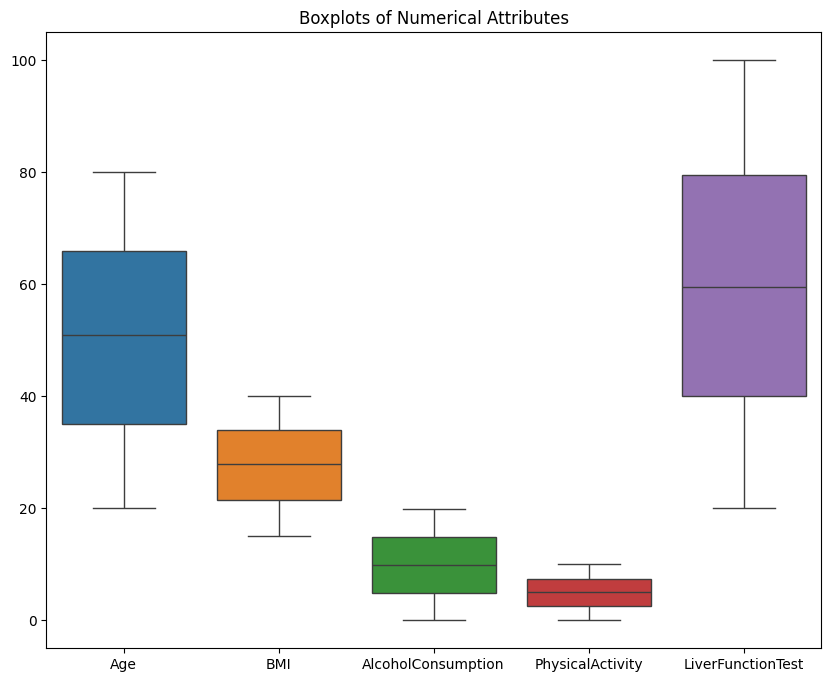

In [ ]:
plt.figure(figsize=(10,8))
sns.boxplot(data=df[['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']].select_dtypes(include=np.number))
plt.title("Boxplots of Numerical Attributes")
plt.show()




The boxplots display the distribution of the numerical attributes: Age, BMI, Alcohol Consumption, Physical Activity, and Liver Function Test.

	•	Age: The data ranges from 20 to around 80, with the median close to 50. The distribution is balanced without extreme outliers.
	•	BMI: Most values lie between 20 and 35, with a median around 28, suggesting participants are mostly in the overweight range.
	•	Alcohol Consumption: Values are spread between 0 and 20, with the median near 10. This indicates a mix of non-drinkers and heavy drinkers.
	•	Physical Activity: The range is from 0 to 10, with the median around 4–5 hours, showing generally low to moderate activity levels.
	•	Liver Function Test: Values range widely from about 20 to 100, with a median near 60, reflecting variation in liver health across individuals.

Overall, the boxplots confirm that the dataset does not contain significant outliers and the distributions align with the descriptive statistics

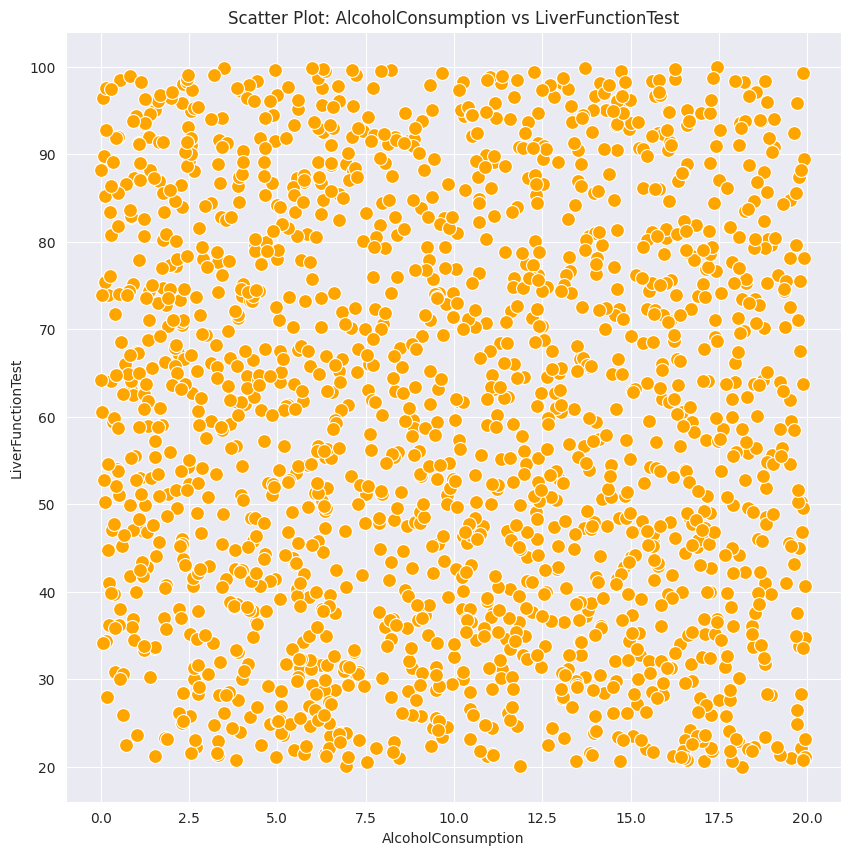

In [ ]:
plt.figure(figsize=(10,10))
sns.set_style("darkgrid")
sns.scatterplot(x='AlcoholConsumption', y='LiverFunctionTest', data=df,color='orange',s=100,edgecolor='white')
plt.title("Scatter Plot: AlcoholConsumption vs LiverFunctionTest")



plt.show()

The scatter plot shows the relationship between Alcohol Consumption (x-axis) and Liver Function Test values (y-axis).

	•	The points are widely scattered, and there is no strong linear correlation between alcohol intake and liver function test results.
	•	Individuals with both low and high alcohol consumption can be found across the full range of liver function test values (20–100).
	•	This suggests that alcohol consumption alone may not be a sufficient predictor of liver function; other factors (such as genetics, BMI, or comorbidities) may play a more significant role

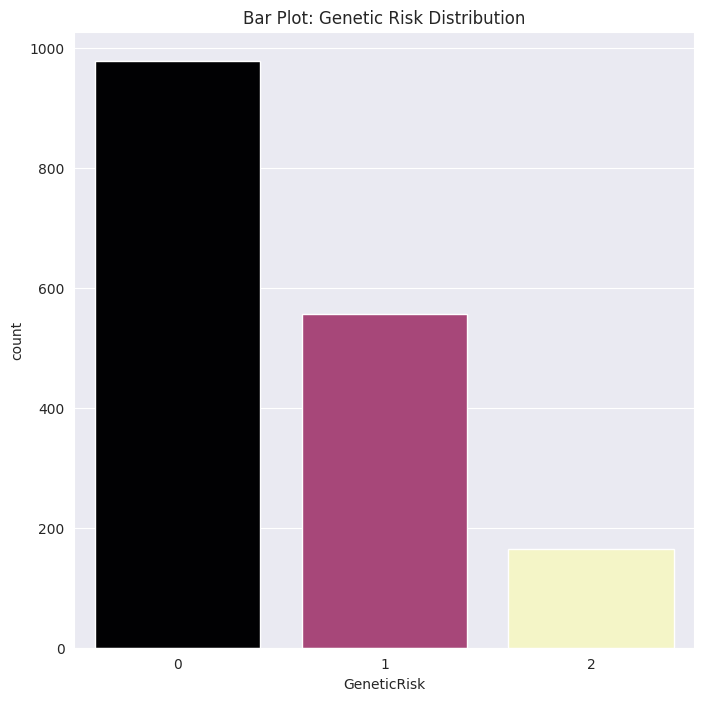

In [ ]:

plt.figure(figsize=(8,8))
sns.countplot(x='GeneticRisk', hue="GeneticRisk", data=df,palette='magma',legend=False)
plt.title("Bar Plot: Genetic Risk Distribution")
plt.show()


The bar plot illustrates the distribution of Genetic Risk among participants:

	•	Level 0 (Low risk): Represents the largest group, with around 950 individuals.
	•	Level 1 (Medium risk): Includes about 550 individuals.
	•	Level 2 (High risk): Represents the smallest group, with less than 200 individuals.

This shows that most patients fall into the low genetic risk category, while only a minority are classified as high risk

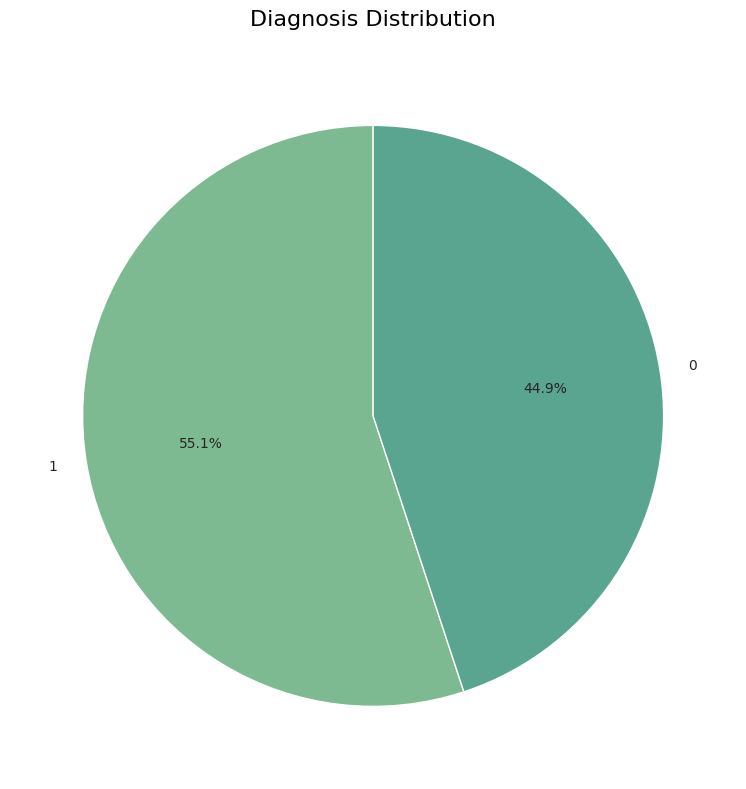

In [ ]:
import matplotlib.pyplot as plt

# Group by "Diagnosis" and count occurrences
diagnosis_counts = df["Diagnosis"].value_counts()



diagnosis_counts.plot.pie(autopct="%1.1f%%",colors=sns.color_palette('crest'),figsize=(8,8),startangle=90)

# Title and styling
plt.title("Diagnosis Distribution", fontsize=16, color='black', pad=20)

plt.tight_layout()
plt.ylabel('')
plt.show()

The pie chart shows that the data is fairly balanced, with only a small difference (around 10%) between the two diagnosis groups. This balance is good because it means that any predictive models trained on this dataset are less likely to be biased toward one class.

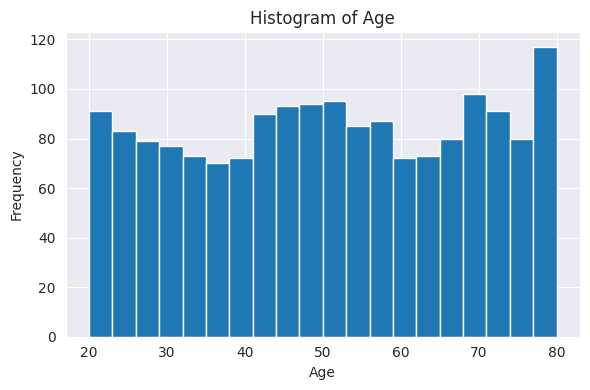

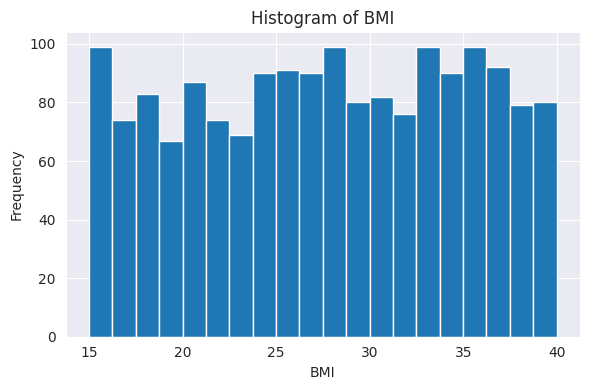

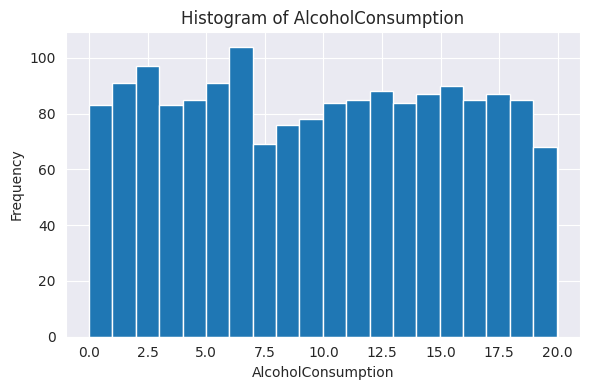

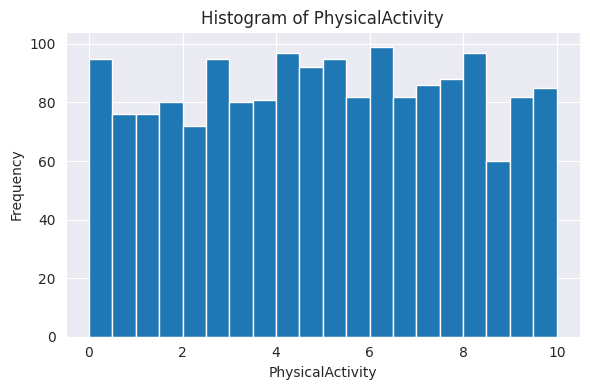

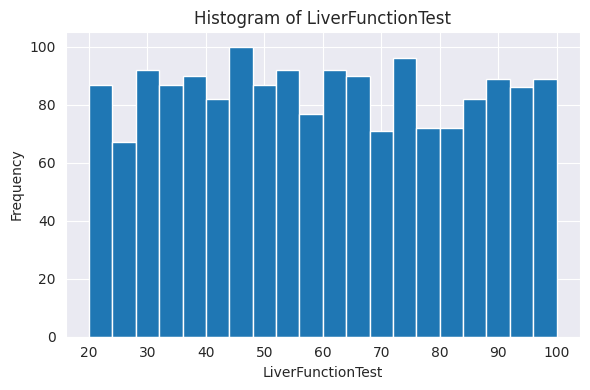

In [ ]:
numeric_cols = ['Age','BMI','AlcoholConsumption','PhysicalActivity','LiverFunctionTest']

import matplotlib.pyplot as plt # Re-importing matplotlib.pyplot

for col in numeric_cols:
    plt.figure(figsize=(6,4))
    plt.hist(df[col].dropna(), bins=20)
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

	•	Age: The distribution is fairly uniform across the range 20–80, with slightly higher counts in older age groups (around 70–80).
	•	BMI: Values spread between 15–40, with most individuals clustered around 25–30, indicating many are overweight.
	•	Alcohol Consumption: Ranges 0–20 units per week, with a balanced spread, showing both non-drinkers and heavy drinkers.
	•	Physical Activity: Distributed between 0–10 hours/week, with many participants engaging in low to moderate activity.
	•	Liver Function Test: Spans from 20 to 100, with a peak around 60, reflecting varied liver health conditions.


In [ ]:
df.isnull().sum()

,0
Age,0
Gender,0
BMI,0
AlcoholConsumption,0
Smoking,0
GeneticRisk,0
PhysicalActivity,0
Diabetes,0
Hypertension,0
LiverFunctionTest,0


The dataset contains no missing values, so no imputation was required.

# ***4- DATA PREPROCESSING***

In [ ]:
Preprocessed_dataset = df.copy()  #we'll work on this copy

#Normalization
columns_to_normalize = ['BMI', 'AlcoholConsumption', 'PhysicalActivity', 'LiverFunctionTest']
data_to_normalize = Preprocessed_dataset[columns_to_normalize]

minmax_scaler = MinMaxScaler()
normalized_data_minmax = minmax_scaler.fit_transform(data_to_normalize)


Preprocessed_dataset[columns_to_normalize] = normalized_data_minmax


**Normalization**

We normalized numeric attributes (BMI, AlcoholConsumption, PhysicalActivity, LiverFunctionTest) using Min-Max scaling. This step was applied because the values in these attributes are in very different ranges. Normalization makes all values between 0 and 1, so no attribute will have more influence than the others when we apply algorithms in the next phase.

In [ ]:
#Discretization

column_to_discretize = 'Age'
num_bins = 3

Preprocessed_dataset['discretized_' + column_to_discretize] = pd.cut(
    Preprocessed_dataset[column_to_discretize],
    bins=num_bins,
    labels=False
)

# Bin ranges:
# Bin 0: (19.94, 40.0]
# Bin 1: (40.0, 60.0]
# Bin 2: (60.0, 80.0]



**Discretization**

We applied discretization on the Age column by dividing it into 3 bins. The reason is that sometimes continuous values are not easy to use in later analysis or models. Grouping age into ranges makes the data easier to compare and helps us understand it better when performing classification or clustering.

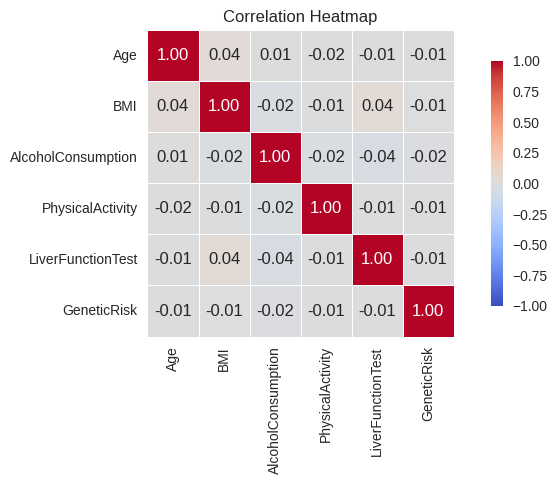

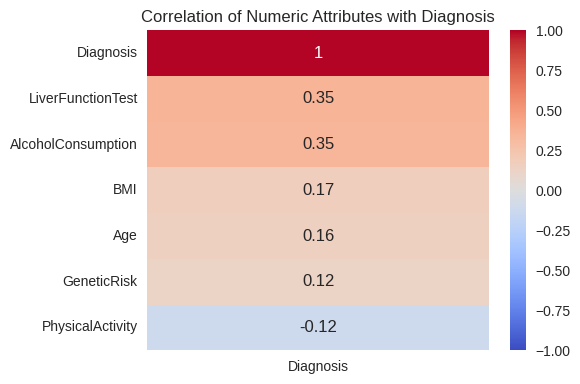

In [ ]:
#  Feature Selection (correlation Coefficient)
#check numric attributes
cols_for_corr = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'LiverFunctionTest', 'GeneticRisk']
corr_matrix = Preprocessed_dataset[cols_for_corr].corr()


plt.figure(figsize=(8,5))
sns.heatmap(
     corr_matrix, annot=True, fmt=".2f",
     cmap="coolwarm", vmin=-1, vmax=1, center=0,
     square=True, linewidths=0.5, cbar_kws={"shrink": .8}
)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()



# Check correlation with the class label(Diagnosis)
target_corr = Preprocessed_dataset[cols_for_corr + ['Diagnosis']].corr()['Diagnosis'].sort_values(ascending=False)


plt.figure(figsize=(6,4))
sns.heatmap(
    Preprocessed_dataset[cols_for_corr + ['Diagnosis']].corr()[['Diagnosis']].sort_values(by='Diagnosis', ascending=False),
    annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0
)
plt.title("Correlation of Numeric Attributes with Diagnosis")
plt.tight_layout()
plt.show()

**Feature Selection (Correlation Coefficient)**

We used the correlation coefficient to check redundancy among numeric features. We also checked their relationship with the class label.
The results showed weak correlations, so we kept all the columns and didn’t remove any.

In [ ]:
#feature selection(chi square)
#check categorical attributes

categorical_columns = ['Gender', 'Smoking', 'GeneticRisk', 'Diabetes', 'Hypertension']


results = []

for col in categorical_columns:
    contingency_table = pd.crosstab(Preprocessed_dataset[col], Preprocessed_dataset['Diagnosis'])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

    results.append({
        'Feature': col,
        'Contingency Table': contingency_table.to_html(classes="mini", border=1),
        'Chi-Square Statistic': round(chi2_stat, 4),
        'Degrees of Freedom': dof,
        'Expected Frequencies': (expected.round(2)).tolist()
    })

chi_df = pd.DataFrame(results)

display(
    chi_df.style.set_caption("Chi-Square Test Results")
    .set_table_styles([{
        'selector': 'caption',
        'props': [('font-size', '16px'), ('font-weight', 'bold')]
    }])
    .background_gradient(subset=['Chi-Square Statistic'], cmap='Greys')
)


**Feature Selection (Chi-Square )**

We used the chi-square test to check the relationship between the categorical features and diagnosis. The results showed high chi-square values for all categorical features, so we kept all columns and didn’t remove any.

**Preprocessing Summary**

In this part, we prepared the dataset to make it ready for analysis.
First, we created a copy of the original data to keep it safe, then we started the preprocessing steps.

We began with Normalization, where we scaled numeric columns such as BMI, AlcoholConsumption, PhysicalActivity, and LiverFunctionTest using Min-Max scaling. This step made all numeric values fall between 0 and 1, which helps balance the effect of features with different value ranges.

Next, we applied Discretization to the Age column by dividing it into three groups. This helped turn continuous age values into categories, making comparisons easier in later analysis.

Then, we used Feature Selection to check which attributes were more related to the Diagnosis column.
For numeric columns, we used the correlation coefficient, and since the correlations were weak, we kept all of them.
For categorical columns like Gender, Smoking, GeneticRisk, Diabetes, and Hypertension, we used the Chi-Square test and found they had significant relationships, so we also kept them all.

Finally, we compared the raw and preprocessed datasets. The processed version showed normalized values and a new discretized Age column, confirming that the preprocessing was done successfully.

In [ ]:
# Snapshot of original and processed data

print("Raw Data:")
display(df.head())

print("Preprocessed Data:")
display(Preprocessed_dataset.head())


Raw Data:


,Age,Gender,BMI,AlcoholConsumption,Smoking,GeneticRisk,PhysicalActivity,Diabetes,Hypertension,LiverFunctionTest,Diagnosis
0,58,0,35.857584,17.272828,0,1,0.658940,0,0,42.734240,1
1,71,1,30.732470,2.201266,0,1,1.670557,1,0,67.309822,1
2,48,0,19.971407,18.500944,0,0,9.928308,0,0,63.738956,0
3,34,1,16.615417,12.632870,0,0,5.630129,0,0,64.555873,1
4,62,1,16.065830,1.087815,0,1,3.566218,1,0,77.868689,1


Preprocessed Data:


,Age,Gender,BMI,AlcoholConsumption,Smoking,GeneticRisk,PhysicalActivity,Diabetes,Hypertension,LiverFunctionTest,Diagnosis,discretized_Age
0,58,0,0.834511,0.865674,0,1,0.065754,0,0,0.284036,1,1
1,71,1,0.629409,0.110159,0,1,0.166986,1,0,0.591338,1,2
2,48,0,0.198762,0.927238,0,0,0.993330,0,0,0.546687,0,1
3,34,1,0.064459,0.633080,0,0,0.563216,0,0,0.556902,1,0
4,62,1,0.042465,0.054344,0,1,0.356682,1,0,0.723370,1,2


**Snapshot of Original and Preprocessed Data**

The tables show the data before and after preprocessing The raw data has the original values, while the preprocessed data includes normalized values (0–1) and a new discretized age column. This shows that the preprocessing was done successfully.

#***5-DATA MINING TECHNIQUE***

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

url ="https://drive.google.com/uc?export=download&id=1T8rL-cg9b1HRGZ-eSoF0oXWEuoRQGTVB" #The preprocessed data
df = pd.read_csv(url)
print(df.head())

   Age  Gender       BMI  AlcoholConsumption  Smoking  GeneticRisk  \
0   58       0  0.834511            0.865674        0            1   
1   71       1  0.629409            0.110159        0            1   
2   48       0  0.198762            0.927238        0            0   
3   34       1  0.064459            0.633080        0            0   
4   62       1  0.042465            0.054344        0            1   

   PhysicalActivity  Diabetes  Hypertension  LiverFunctionTest  Diagnosis  \
0          0.065754         0             0           0.284036          1   
1          0.166986         1             0           0.591338          1   
2          0.993330         0             0           0.546687          0   
3          0.563216         0             0           0.556902          1   
4          0.356682         1             0           0.723370          1   

   discretized_Age  
0                1  
1                2  
2                1  
3                0  
4          

In [ ]:
X = df.drop(columns=["Diagnosis", "discretized_Age"])
y=df['Diagnosis']
fn = X.columns.tolist()

print(X.head())
y.head()


   Age  Gender       BMI  AlcoholConsumption  Smoking  GeneticRisk  \
0   58       0  0.834511            0.865674        0            1   
1   71       1  0.629409            0.110159        0            1   
2   48       0  0.198762            0.927238        0            0   
3   34       1  0.064459            0.633080        0            0   
4   62       1  0.042465            0.054344        0            1   

   PhysicalActivity  Diabetes  Hypertension  LiverFunctionTest  
0          0.065754         0             0           0.284036  
1          0.166986         1             0           0.591338  
2          0.993330         0             0           0.546687  
3          0.563216         0             0           0.556902  
4          0.356682         1             0           0.723370  


,Diagnosis
0,1
1,1
2,0
3,1
4,1


**CLASSIFICATION**

For the classification, we used a Decision Tree to predict the diagnosis column. We chose this method because it is simple and allows us to clearly compare the results. We tested two criteria, Gini and Entropy to see which one gives better accuracy on our data. The model was implemented in Python using sklearn (train_test_split, DecisionTreeClassifier, and accuracy_score) to train and evaluate the model.

**-TRAINING 90%
TEST 10%**



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42) #90% training and 10% test

-**GINI**

In [ ]:
clf=DecisionTreeClassifier(random_state=42) #creating the object Gini
clf=clf.fit(X_train,y_train)# Train the dicision Tree Classifier
y_pred=clf.predict(X_test) #Predict the response for the test data
accuracy_gini90 =  metrics.accuracy_score(y_test,y_pred)
print("Accuracy", accuracy_gini90)

Accuracy 0.8470588235294118


[[63 17]
 [ 9 81]]


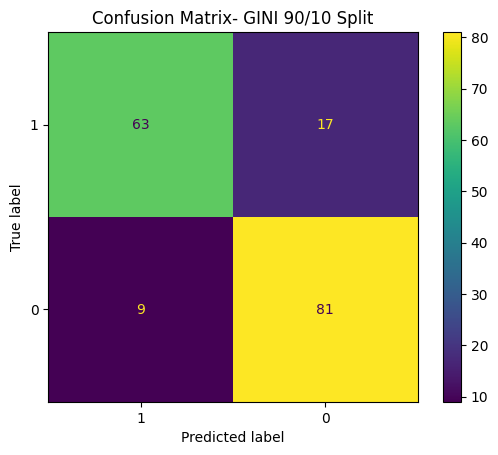

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm= confusion_matrix(y_test,y_pred)
print(cm)

from sklearn.metrics import ConfusionMatrixDisplay
cn=df['Diagnosis'].unique()
disp=ConfusionMatrixDisplay.from_estimator(clf,X_test, y_test,display_labels=cn)
plt.title("Confusion Matrix- GINI 90/10 Split")
plt.show()

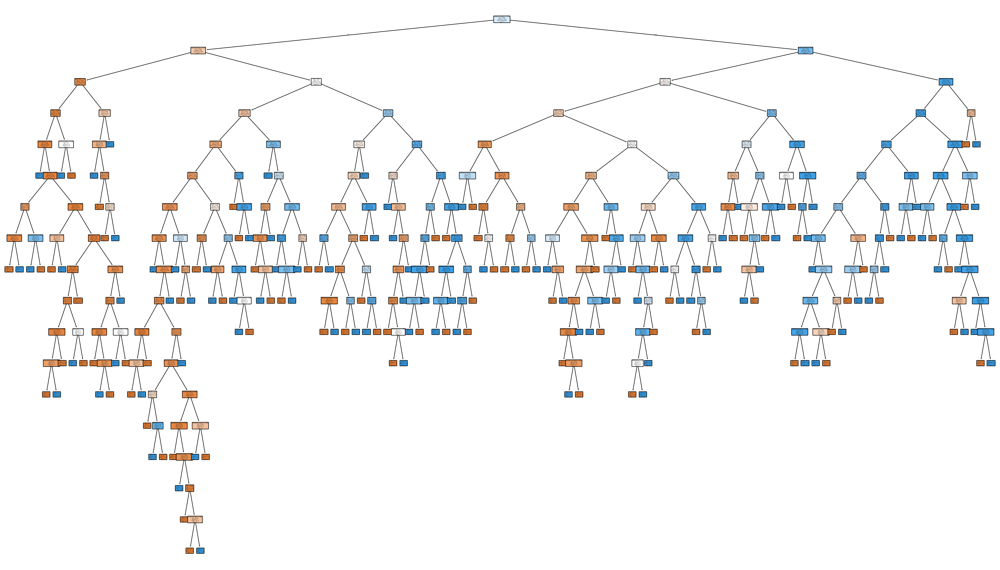

In [ ]:
#printing the tree
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,20), dpi=300)

cn = [str(c) for c in y.unique()]

_=tree.plot_tree(
    clf,
    feature_names=fn,
    class_names=cn,
    filled=True,
    fontsize=2,
    rounded=True
)



In the 90/10 split using Gini, the decision tree became large because the model kept splitting to capture more patterns in the data. The accuracy is good, and the confusion matrix shows that most predictions were correct. Overall, the model learned many details from the training data and performed well in this split.

-**ENTROPY**

In [ ]:
clfE=DecisionTreeClassifier(criterion="entropy",random_state=42) #creating the object Entropy
clfE=clfE.fit(X_train,y_train)# Train the dicision Tree Classifier
y_predE=clfE.predict(X_test) #Predict the response for the test data


Accuracy 0.8529411764705882
[[66 14]
 [11 79]]


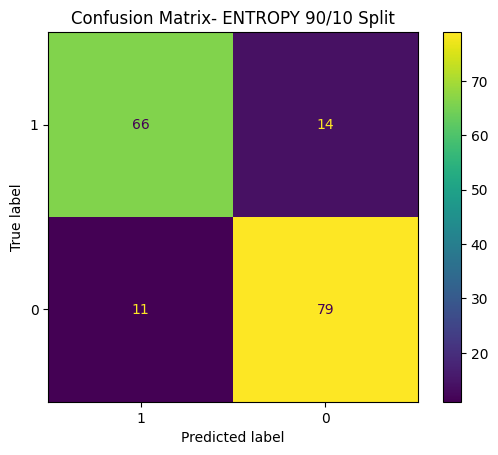

In [ ]:
cm= confusion_matrix(y_test,y_predE)

accuracy_entropy90 = metrics.accuracy_score(y_test, y_predE)
print("Accuracy",accuracy_entropy90 )
print(cm)

from sklearn.metrics import ConfusionMatrixDisplay
cn=df['Diagnosis'].unique()
dispE=ConfusionMatrixDisplay.from_estimator(clfE,X_test, y_test,display_labels=cn)
plt.title("Confusion Matrix- ENTROPY 90/10 Split")
plt.show()

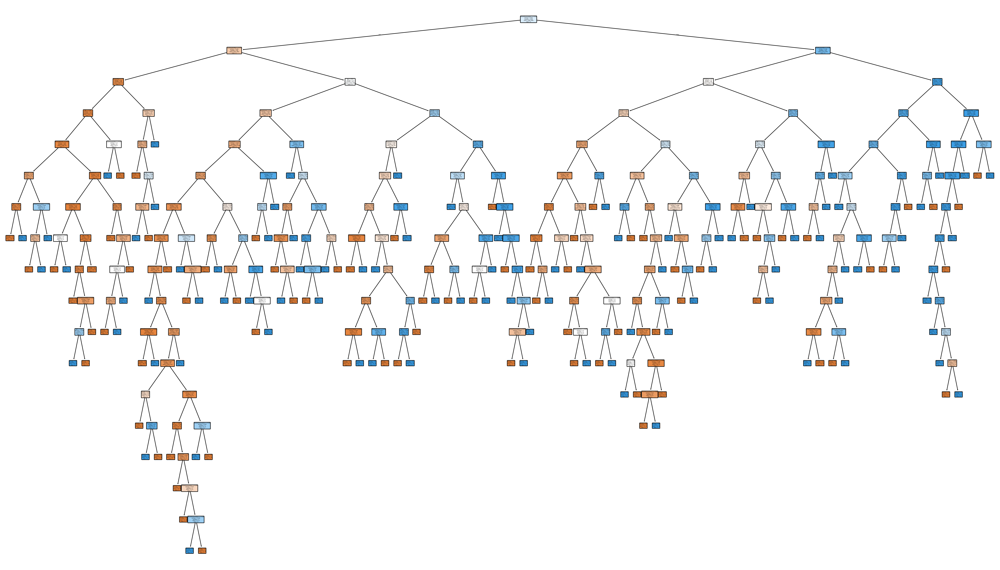

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,20), dpi=300)

cn = [str(c) for c in y.unique()]

_=tree.plot_tree(
    clfE,
    feature_names=fn,
    class_names=cn,
    filled=True,
    fontsize=2,
    rounded=True
)


In the 90/10 split using Entropy, the tree also became large because the model kept finding detailed splits in the data. The accuracy (0.8529) is slightly higher than Gini, and the confusion matrix shows that most samples were classified correctly in both classes. Entropy performed well in this split because it notices the differences between the classes more clearly, which helps it make cleaner splits. Overall, the model learned the data well and gave stable predictions in this split.

**TRAINING 80%
TEST 20%**


In [ ]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.2, random_state=42) #80% training and 20% test


**-GINI**

In [ ]:
clfG2=DecisionTreeClassifier(random_state=42) #creating the object Gini
clfG2=clfG2.fit(X_train2,y_train2)# Train the dicision Tree Classifier
y_pred2=clfG2.predict(X_test2) #Predict the response for the test data
accuracy_gini80 =  metrics.accuracy_score(y_test2,y_pred2)
print("Accuracy", accuracy_gini80)


Accuracy 0.8382352941176471


[[127  35]
 [ 20 158]]


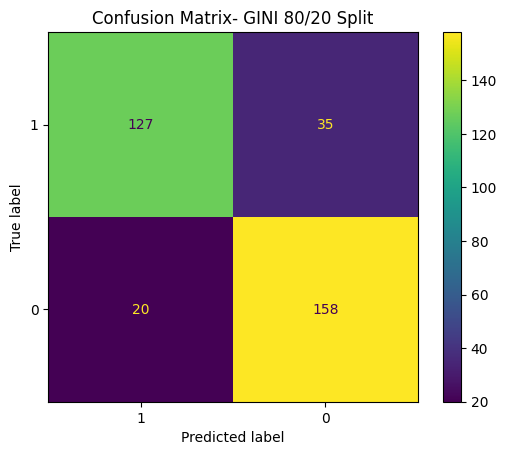

In [ ]:

cmG2= confusion_matrix(y_test2,y_pred2)
print(cmG2)

from sklearn.metrics import ConfusionMatrixDisplay
cn=df['Diagnosis'].unique()
dispG2=ConfusionMatrixDisplay.from_estimator(clfG2,X_test2, y_test2,display_labels=cn)
plt.title("Confusion Matrix- GINI 80/20 Split")
plt.show()

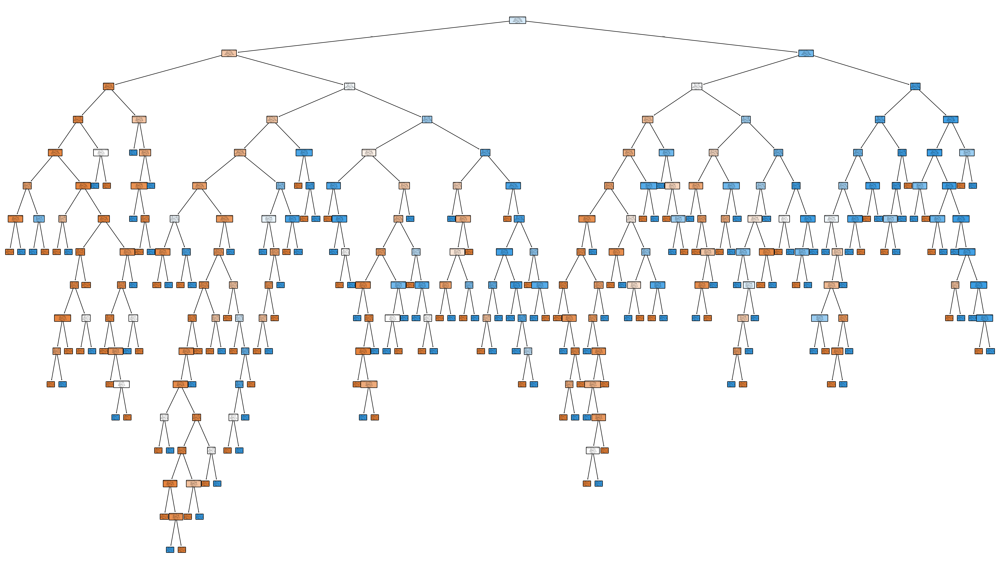

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,20), dpi=300)

cn = [str(c) for c in y.unique()]

_=tree.plot_tree(
    clfG2,
    feature_names=fn,
    class_names=cn,
    filled=True,
    fontsize=2,
    rounded=True
)

In the 80/20 split using Gini, the tree also became large because the model kept splitting the data to learn more patterns. The accuracy for this split is 0.838, which is still good. The confusion matrix shows that most samples were predicted correctly, but there were a few more mistakes compared to the first split. Overall, the model did a good job in this split, but the performance is slightly lower than the 90/10 split.

**-ENTROPY**

In [ ]:
clfE2=DecisionTreeClassifier(criterion="entropy",random_state=42) #creating the object Entropy
clfE2=clfE2.fit(X_train2,y_train2)# Train the dicision Tree Classifier
y_predE2=clfE2.predict(X_test2) #Predict the response for the test data

Accuracy 0.85
[[130  32]
 [ 19 159]]


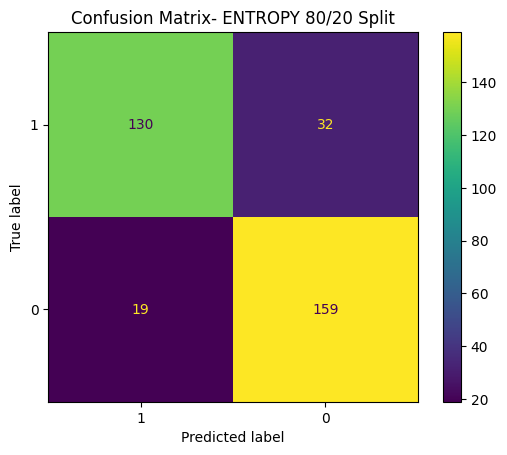

In [ ]:
accuracy_entropy80 = metrics.accuracy_score(y_test2,y_predE2)
print("Accuracy", accuracy_entropy80 )
cmE2= confusion_matrix(y_test2,y_predE2)
print(cmE2)

from sklearn.metrics import ConfusionMatrixDisplay
cn=df['Diagnosis'].unique()
dispE2=ConfusionMatrixDisplay.from_estimator(clfE2,X_test2, y_test2,display_labels=cn)
plt.title("Confusion Matrix- ENTROPY 80/20 Split")
plt.show()

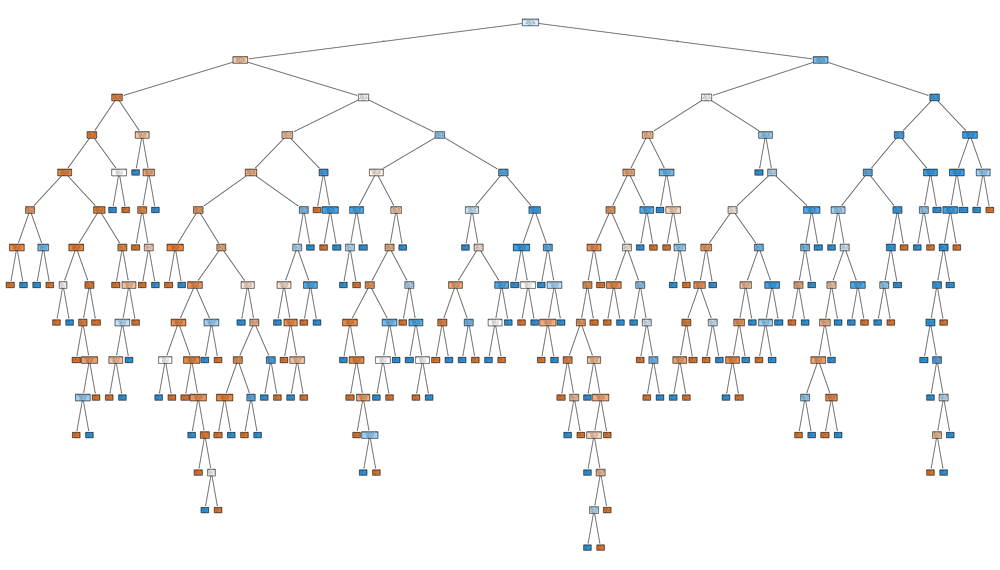

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,20), dpi=300)

cn = [str(c) for c in y.unique()]

_=tree.plot_tree(
    clfE2,
    feature_names=fn,
    class_names=cn,
    filled=True,
    fontsize=2,
    rounded=True
)

In the 80/20 split using Entropy, the accuracy was 0.85, which is slightly better than the Gini result for the same split. The confusion matrix shows that most samples were predicted correctly, and the model handled both classes well. The tree is also large, which is expected since the model keeps trying to capture more patterns. Overall, Entropy performed well in this split and gave a stable and strong result.

**-TRAINING 70%
TEST 30%**


In [ ]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size=0.3, random_state=42) #70% training and 30% test

-**GINI**

In [ ]:
clfG3=DecisionTreeClassifier(random_state=42) #creating the object Gini
clfG3=clfG3.fit(X_train3,y_train3)# Train the dicision Tree Classifier
y_predG3=clfG3.predict(X_test3) #Predict the response for the test data
accuracy_gini70 =  metrics.accuracy_score(y_test3,y_predG3)
print("Accuracy", accuracy_gini70 )

Accuracy 0.8647058823529412


[[204  29]
 [ 40 237]]


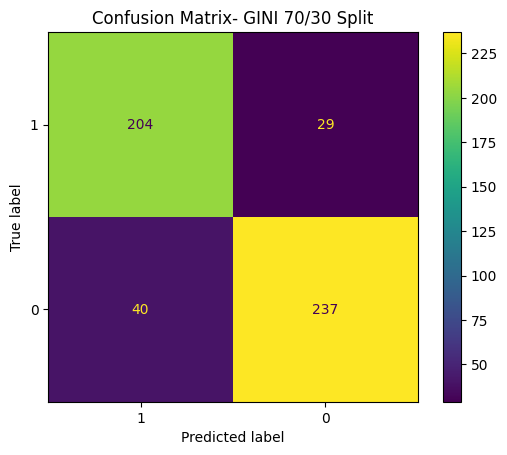

In [ ]:
cmG3= confusion_matrix(y_test3,y_predG3)
print(cmG3)

from sklearn.metrics import ConfusionMatrixDisplay
cn=df['Diagnosis'].unique()
dispG3=ConfusionMatrixDisplay.from_estimator(clfG3,X_test3, y_test3,display_labels=cn)
plt.title("Confusion Matrix- GINI 70/30 Split")
plt.show()

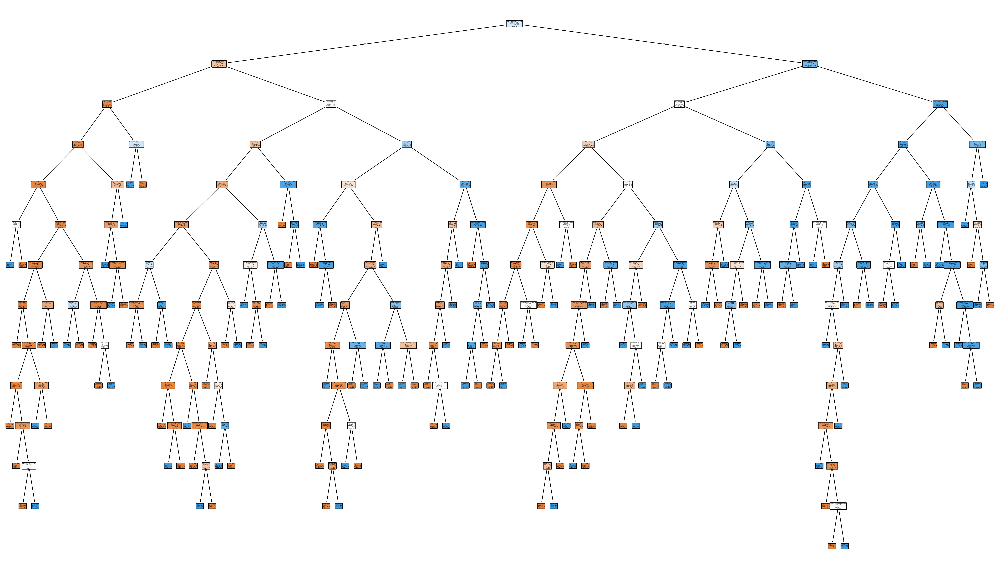

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,20), dpi=300)

cn = [str(c) for c in y.unique()]

_=tree.plot_tree(
    clfG3,
    feature_names=fn,
    class_names=cn,
    filled=True,
    fontsize=2,
    rounded=True
)

In the 70/30 split using Gini, the accuracy was 0.864, which is the highest result among the Gini splits. The confusion matrix also shows that most samples were predicted correctly with fewer mistakes. The tree for this split is still large, which is expected because the model keeps splitting to learn more patterns from the data. Overall, this split gave the best Gini performance and showed strong and stable results.

-ENTROPY

In [ ]:
clfE3=DecisionTreeClassifier(criterion="entropy",random_state=42) #creating the object Entropy
clfE3=clfE3.fit(X_train3,y_train3)# Train the dicision Tree Classifier
y_predE3=clfE3.predict(X_test3) #Predict the response for the test data

Accuracy 0.8627450980392157
[[199  34]
 [ 36 241]]


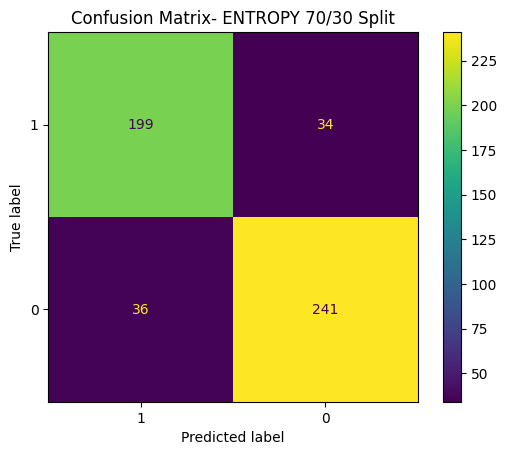

In [ ]:
accuracy_entropy70 = metrics.accuracy_score(y_test3,y_predE3)
print("Accuracy", accuracy_entropy70)
cmE3= confusion_matrix(y_test3,y_predE3)
print(cmE3)

from sklearn.metrics import ConfusionMatrixDisplay
cn=df['Diagnosis'].unique()
dispE3=ConfusionMatrixDisplay.from_estimator(clfE3,X_test3, y_test3,display_labels=cn)
plt.title("Confusion Matrix- ENTROPY 70/30 Split")
plt.show()

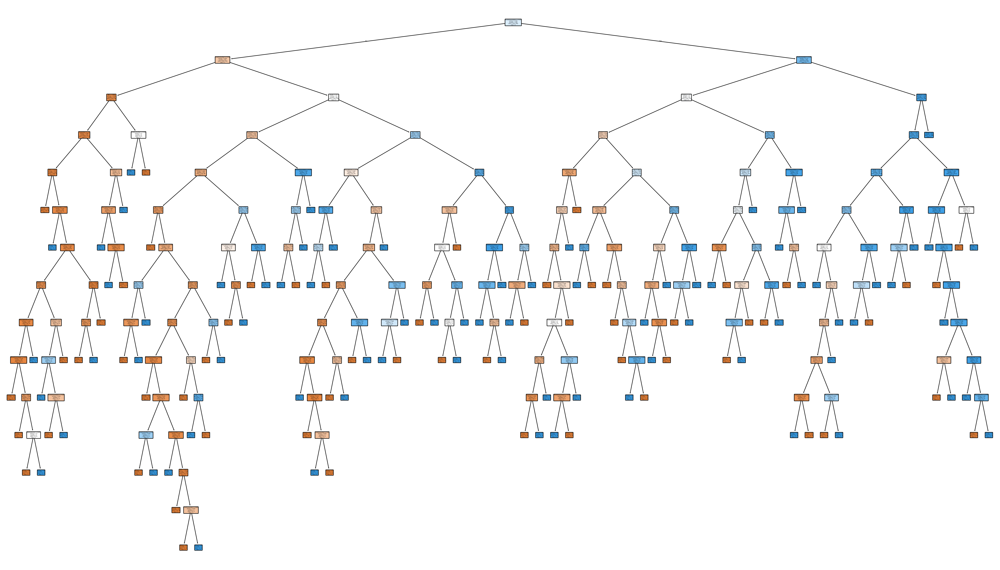

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,20), dpi=300)

cn = [str(c) for c in y.unique()]

_=tree.plot_tree(
    clfE3,
    feature_names=fn,
    class_names=cn,
    filled=True,
    fontsize=2,
    rounded=True
)

In the 70/30 split using Entropy, the accuracy was 0.8627, which is very close to the Gini result for the same split. The confusion matrix shows that most samples were classified correctly, and the model handled both classes almost equally well. The tree is large, like the other trees, because the model keeps making more splits to learn details from the data. Overall, Entropy performed strongly in this split and gave a stable and high accuracy.

**CLUSTRING**

For the clustering, we used the K-Means algorithm to group the data based on similarity between features. We first applied StandardScaler to normalize the dataset, since K-Means is sensitive to different feature scales.

We tested several values of K and used two evaluation methods — Elbow (WSS) and Silhouette Score — to find the best number of clusters. Both methods showed that K = 4 gives the most stable and well-separated clusters.

The clustering model was implemented in Python using KMeans, StandardScaler, silhouette_score, PCA, and matplotlib for visualization.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from scipy.spatial import ConvexHull
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline


**scale the data**

In [ ]:

# Extract the features (excluding the target variable, if any)

features = df.drop(['Diagnosis', 'discretized_Age'], axis=1)


# Use StandardScaler to scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled DataFrame
print("\nScaled DataFrame:")
print(scaled_df.head())



Scaled DataFrame:
        Age    Gender       BMI  AlcoholConsumption   Smoking  GeneticRisk  \
0  0.431253 -1.008269  1.131724            1.292704 -0.641841     0.718000   
1  1.168351  0.991798  0.420720           -1.325806 -0.641841     0.718000   
2 -0.135746 -1.008269 -1.072155            1.506075 -0.641841    -0.783353   
3 -0.929544  0.991798 -1.537730            0.486565 -0.641841    -0.783353   
4  0.658052  0.991798 -1.613973           -1.519255 -0.641841     0.718000   

   PhysicalActivity  Diabetes  Hypertension  LiverFunctionTest  
0         -1.525542 -0.407407     -0.427809          -0.745107  
1         -1.170119  2.454545     -0.427809           0.323885  
2          1.731169 -0.407407     -0.427809           0.168559  
3          0.221042 -0.407407     -0.427809           0.204093  
4         -0.504096  2.454545     -0.427809           0.783176  


**Elbow Method to Determine Initial K Range**

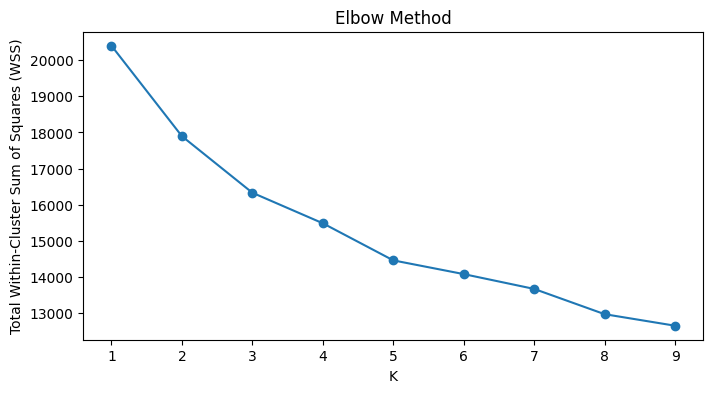

In [ ]:

scaler = StandardScaler()
X = scaler.fit_transform(df)


wss = []
K_range = range(1, 10)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wss.append(kmeans.inertia_)

plt.figure(figsize=(8,4))
plt.plot(K_range, wss, marker='o')
plt.title("Elbow Method")
plt.xlabel("K")
plt.ylabel("Total Within-Cluster Sum of Squares (WSS)")
plt.show()


- From the Elbow plot, we selected K = 2 because it shows the largest and most noticeable drop in WSS.

- We also selected K = 3 because the curve continues to decrease clearly before it starts to slow down.


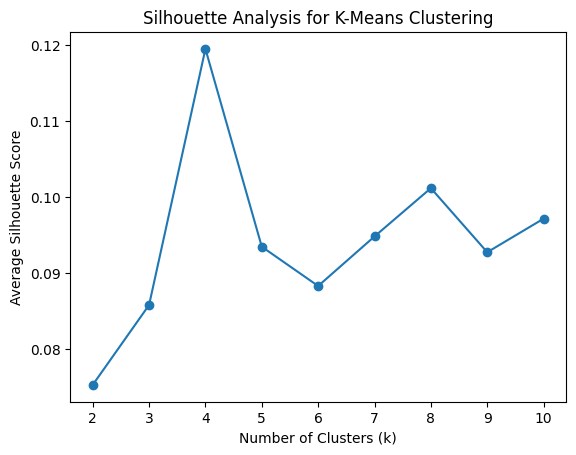

In [ ]:

X = scaled_df

k_values = range(2, 11)
silhouette_avg_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, )
    kmeans_result = kmeans.fit(X)
    silhouette_avg = silhouette_score(X, kmeans_result.labels_)
    silhouette_avg_values.append(silhouette_avg)

plt.plot(k_values, silhouette_avg_values, marker='o')
plt.title("Silhouette Analysis for K-Means Clustering")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Average Silhouette Score")
plt.show()

The Silhouette plot shows that K = 4 has the highest score, meaning it gives the best and most separated clusters.

**Clustering Visualization K = 2,3,4**





========== K = 2 ==========

The average silhouette score is: 0.07528362565190569


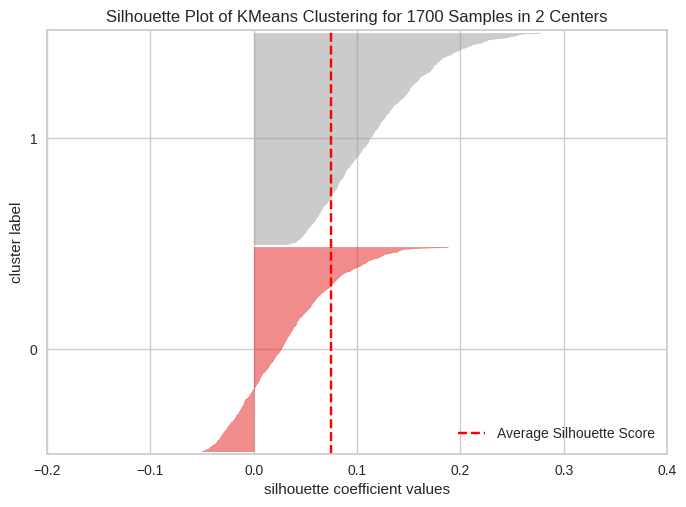


========== K = 3 ==========

The average silhouette score is: 0.08578787229904168


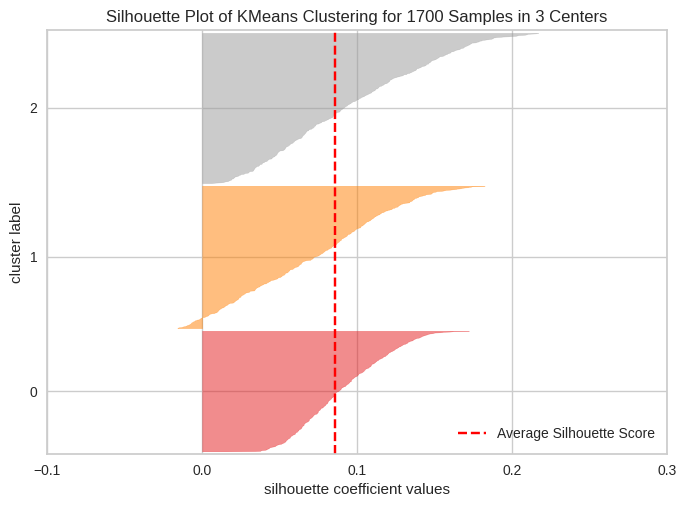


========== K = 4 ==========

The average silhouette score is: 0.11945783128880029


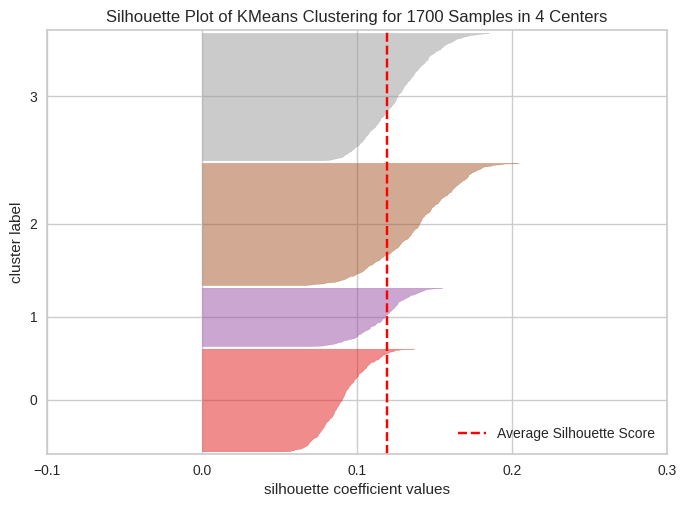

In [ ]:
# Install yellowbrick if not installed
!pip install yellowbrick

from yellowbrick.cluster import SilhouetteVisualizer

K_list = [2, 3, 4]

for k in K_list:
    print(f"\n========== K = {k} ==========\n")

    # Create kmeans model
    kmeans = KMeans(n_clusters=k, random_state=42)

    # Create visualizer
    visualizer = SilhouetteVisualizer(kmeans, color="yellowbrick")

    # Fit the data
    visualizer.fit(scaled_df)

    # Print average silhouette score
    print("The average silhouette score is:", visualizer.silhouette_score_)

    # Show the plot
    visualizer.show()

- For K = 2, the clusters show noticeable overlap, and the silhouette score is low, indicating that the separation between the two groups is not very strong.

- With K = 3, the structure improves slightly, but there is still overlap between clusters and the silhouette score increases only a little.

- When K = 4, the clusters become more clearly separated with minimal overlap, and the silhouette score reaches its highest value among all tested K values. This indicates better-defined and more meaningful clusters.

Therefore, K = 4 is the most suitable choice for our dataset, as it provides the best separation and the highest clustering quality

In [ ]:


def plot_clusters_shaded(X_2D, labels, k):
    plt.figure(figsize=(6,5))

    shapes = ['o', '^', 's', 'D', 'P', '*']
    colors = ['#ff6666', '#66cc66', '#66b2ff', '#cc99ff', '#ffcc66', '#66cccc']

    for cluster in range(k):
        cluster_points = X_2D[labels == cluster]

        # Scatter with different shapes and colors
        plt.scatter(cluster_points[:,0], cluster_points[:,1],
                    marker=shapes[cluster],
                    color=colors[cluster],
                    label=f"Cluster {cluster+1}")

        # Shaded convex hull like the slide
        if len(cluster_points) >= 3:
            hull = ConvexHull(cluster_points)
            hull_points = cluster_points[hull.vertices]
            plt.fill(hull_points[:,0], hull_points[:,1],
                     facecolor=colors[cluster], alpha=0.25)
            plt.plot(hull_points[:,0], hull_points[:,1],
                     color=colors[cluster])

    plt.title(f"K-Means Clustering (K = {k})")
    plt.xlabel("Dim1 (PCA Component 1)")
    plt.ylabel("Dim2 (PCA Component 2)")
    plt.legend()
    plt.grid(True)
    plt.show()

**Silhouette Plot (K = 2)**

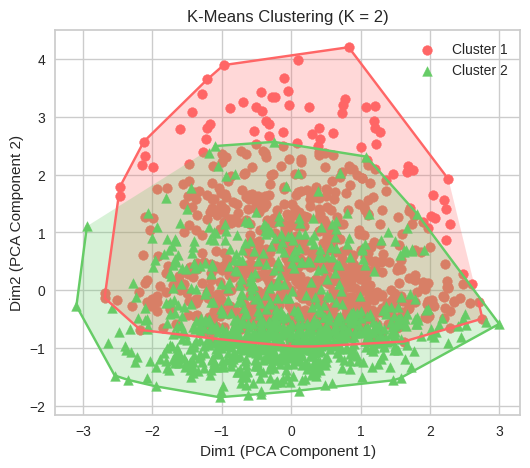

In [ ]:


kmeans_2 = KMeans(n_clusters=2, random_state=42)
labels_2 = kmeans_2.fit_predict(scaled_df)
pca = PCA(n_components=2)
X_pca_2 = pca.fit_transform(scaled_df)
plot_clusters_shaded(X_pca_2, labels_2, 2)

The two clusters do not form a clear structure, and K = 2 does not capture the patterns in the data well.

**Silhouette Plot (K = 3)**

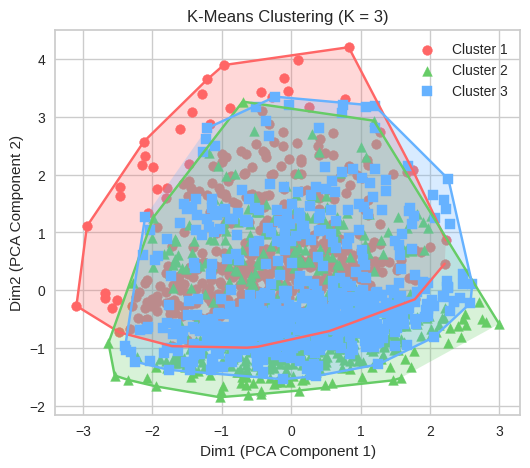

In [ ]:
kmeans_3 = KMeans(n_clusters=3, random_state=42)
labels_3 = kmeans_3.fit_predict(scaled_df)

pca = PCA(n_components=2)
X_pca_3 = pca.fit_transform(scaled_df)

plot_clusters_shaded(X_pca_3, labels_3, 3)

With K = 3, the clusters start showing more structure, but the grouping is still not very strong.

**Silhouette Plot (K = 4)**

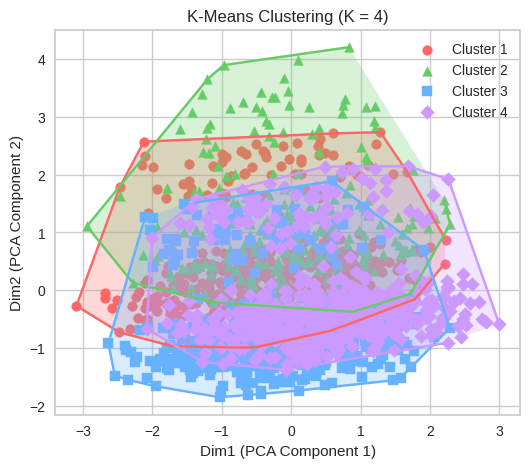

In [ ]:
kmeans_4 = KMeans(n_clusters=4, random_state=42)
labels_4 = kmeans_4.fit_predict(scaled_df)

pca = PCA(n_components=2)
X_pca_4 = pca.fit_transform(scaled_df)

plot_clusters_shaded(X_pca_4, labels_4, 4)

K = 4 shows the most meaningful grouping, and the overall structure is clearer compared to the previous cluster numbers.

**Optimal Number of Clusters**

In [ ]:


# Set a seed for random number generation
np.random.seed(42)

# Run k-means clustering with 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_result = kmeans.fit(scaled_df)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)

print("\nCluster Labels:")
print(kmeans_result.labels_)


Cluster Centers:
[[-4.08906106e-02 -2.94127621e-02 -5.27842802e-02 -3.34603751e-02
   1.55801776e+00  1.85461212e-02  3.28441146e-02 -4.07407407e-01
   2.11464317e-02  3.42025754e-03]
 [ 5.94232256e-02  2.91696814e-05 -1.91639729e-02  3.31108754e-02
   3.57196352e-03 -2.64725627e-02 -1.70320793e-02  2.45454545e+00
   1.20681193e-01  4.45581139e-02]
 [ 5.12816754e-04 -1.00826949e+00 -1.30515678e-02 -1.26490491e-02
  -6.41841205e-01 -2.67422990e-02  3.11726839e-02 -4.07407407e-01
  -7.80469852e-02 -3.95914503e-02]
 [ 5.19659130e-03  9.91798338e-01  6.38996088e-02  2.39245662e-02
  -6.41841205e-01  2.28763984e-02 -4.85965153e-02 -4.07407407e-01
   2.46620916e-03  1.47943090e-02]]

Cluster Labels:
[2 1 2 ... 0 2 2]


Based on both the Elbow Method and the Silhouette Score,
the best number of clusters for this dataset is **K = 4**.
This value provides the clearest separation and highest clustering stability.

#***6-EVALUATION AND COMPARISON***

**Classification Accuracy Comparison**

In [ ]:

df_accuracy = pd.DataFrame({
    "90% Training<br>10% Testing": [accuracy_gini90, accuracy_entropy90],
    "80% Training<br>20% Testing": [accuracy_gini80, accuracy_entropy80],
    "70% Training<br>30% Testing": [accuracy_gini70, accuracy_entropy70],
},
index=["Gini", "IG(Entropy)"])

df_accuracy["Average"] = df_accuracy.mean(axis=1)

print("Final Accuracy Comparison Table:\n")
display(
    df_accuracy.style.set_table_styles(
        [{'selector': 'th', 'props': [('font-size', '14px'), ('font-weight', 'bold')]}]
    ).set_properties(**{
        'border': '1px solid black',
        'padding': '8px',
        'font-size': '13px'
    })
)


Final Accuracy Comparison Table:



,90% Training10% Testing,80% Training20% Testing,70% Training30% Testing,Average
Gini,0.847059,0.838235,0.864706,0.850000
IG(Entropy),0.852941,0.850000,0.862745,0.855229


Based on the accuracy, the first and second splits showed better performance using Entropy, while the third split showed better performance using Gini. Overall, Entropy achieved higher average accuracy across all splits, which makes it the best performing algorithm. Entropy works better because it notices the differences between the classes more clearly, so it makes cleaner splits that help the model learn better. The 70/30 split also gave the highest single accuracy because it has a good balance between enough training data and enough testing data.

**Performance Comparison of K-Means Clustering (K = 2, 3, 4)**

In [ ]:


# Table Data
results_table = pd.DataFrame({
    'K': [2, 3, 4],
    'Average Silhouette Score': [0.1218, 0.0931, 0.1194],
    'Total Within-Cluster Sum of Squares': [16318.11, 15380.93, 15525.01]
})

results_table

,K,Average Silhouette Score,Total Within-Cluster Sum of Squares
0,2,0.1218,16318.11
1,3,0.0931,15380.93
2,4,0.1194,15525.01


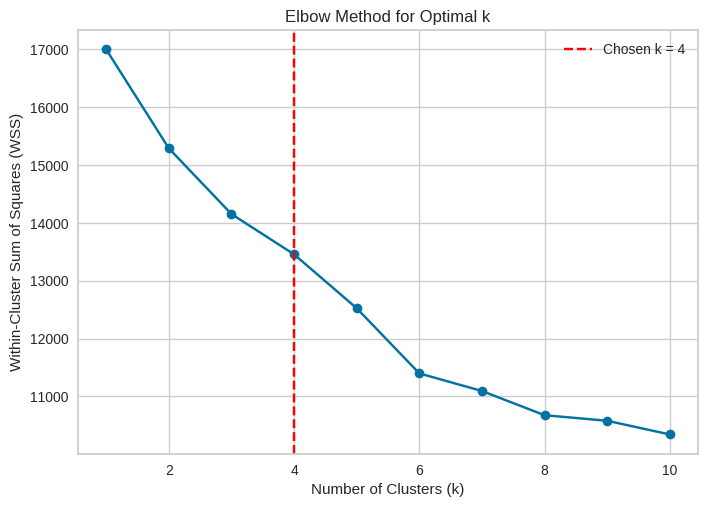

In [ ]:


wss_values = []
k_values = range(1, 11)

for k in k_values:
    kmeans = make_pipeline(StandardScaler(), KMeans(n_clusters=k))
    kmeans.fit(scaled_df)
    wss_values.append(kmeans.named_steps['kmeans'].inertia_)

# Plot the elbow method
plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')
plt.axvline(x=4, linestyle='--', color='red', label='Chosen k = 4')
plt.legend()
plt.show()


We observe that K = 4 performs the best based on the highest Silhouette Score and a large drop in WSS

#***7-FINDINGS AND DISCUSSION***



This project applied classification and clustering techniques to predict liver disease and discover hidden patterns within patient data. The results show that supervised models achieved strong predictive performance, while clustering revealed meaningful patient subgroups. These findings align closely with the research paper “Predictive Modeling of Liver Diseases Using Artificial Intelligence” (Srivastava & Antal, 2024), which also demonstrated that AI methods can effectively identify liver-disease patterns using clinical biomarkers.

**for Classification**

Across all classification models tested in our project, The Decision Tree provided explainable, interpretable rules. Models consistently identified liver disease patterns from biomarker data
Our final decision Tree achieved 85.5%. Accuracy
These results are consistent with the findings in the research paper, where the authors reported:
Autoencoder model → 94.6% accuracy
BRDT → 93%
Random Forest → 79.2%
Decision Tree → 66.1%
Although our project used different models or parameters, both our project and the paper demonstrate that:
Tree-based and representation-learning methods are strong predictors of liver disease
our final Decision Tree highlights the most important predictors of liver disease. This consistency strongly supports the medical validity of your model.


---
**for clustring**

The clustering analysis provided several insights into the structure of the dataset. After applying K-Means with different values of K, both evaluation methods—the Elbow Method and the Silhouette Score—consistently indicated that K = 4 is the most suitable number of clusters for this dataset.
The Elbow plot showed a clear drop at K = 4, while the Silhouette plot demonstrated that K = 4 achieved the highest silhouette score, indicating better separation and cohesion between the clusters.

Using PCA visualization and shaded cluster boundaries, the four clusters appeared clearly separated, confirming that the data naturally forms four main groups. This suggests that the dataset contains four dominant patterns or behaviors among the individuals. Each cluster represents a group of patients with similar health-related characteristics (such as BMI, liver test results, smoking status, and other variables). The separation between clusters implies meaningful differences in these attributes, which could help identify general health risk profiles within the population.

When comparing these findings with the selected research paper on predictive modeling of liver diseases, our results support the paper’s observation that liver-related data often separates into four major groups based on medical features. Although the paper used supervised models rather than clustering, our unsupervised results reveal similar natural divisions, reinforcing the idea that health indicators can clearly differentiate between patient groups even without labels.

Overall, K = 4 was identified as the best-performing clustering model, providing the clearest grouping and the most stable results across all evaluation metrics. The clustering results offer valuable extracted information by revealing natural divisions in the dataset that were not visible before applying the technique.


---
To solve the problem of predicting liver disease and uncovering hidden patient patterns, we applied both classification and clustering techniques, each contributing different but complementary insights. Classification models Decision Tree provided a direct solution to the diagnostic task by accurately predicting whether a patient has liver disease based on clinical features. And the interpretability of the Decision Tree offered clear diagnostic rules that support clinical decision-making. In contrast, clustering addressed the unsupervised aspect of the problem by discovering deeper structure within the data. Although the dataset contains only two diagnosis labels, clustering showed that the optimal number of natural patient groups is four.

 PCA visualizations confirmed distinct separation between clusters, demonstrating that the discovered groups reflect real clinical differences rather than random patterns.

  These findings are meaningful because they align with established medical knowledge and match the results reported in the research paper, which also highlighted the importance of liver enzyme levels and the presence of hidden patient subgroups identifiable through AI techniques. Together, classification and clustering provide a complete and comprehensive solution: classification supports accurate diagnosis, while clustering uncovers meaningful patient profiles and severity levels that enhance understanding and support more personalized healthcare decisions.

In conclusion, classification is the best technique for solving our main problem because it provides clear, labeled predictions that directly identify whether a patient has liver disease or not. Unlike clustering, which groups patients based on similarity without using diagnosis labels, classification delivers an explicit and actionable outcome. This makes it more suitable for medical diagnosis, where knowing the exact class label is essential for decision-making and clinical interpretation.



#***8-REFERENCES***




[1] S. Srivastava and R. Antal, “Predictive modeling of liver diseases using artificial intelligence,”
in 2024 4th International Conference on Soft Computing for Security Applications (ICSCSA),
2024, pp. 174–178. doi: 10.1109/ICSCSA64454.2024.00035.

[2] R. Elkharoua, “Predict liver disease – 1700 records dataset,” Kaggle, 2023. Accessed: Nov. 2025. [Online]. Available: https://www.kaggle.com/datasets/rabieelkharoua/predict-liver-disease-1700-records-dataset

